<a href="https://colab.research.google.com/github/PsorTheDoctor/artificial-intelligence/blob/master/modern_approach/diffusion_models/ddpm_pytorch.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Denoising Diffusion Probabilistic Model

In [ ]:
!git clone https://github.com/HesamAsad/diffusion-models-deeplearning.ai-course.git
%cd diffusion-models-deeplearning.ai-course/notebooks/

In [ ]:
import os
from typing import Dict, Tuple
from tqdm import tqdm
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torchvision import datasets, models, transforms
from torchvision.utils import save_image, make_grid
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter
import numpy as np
from IPython.display import HTML
from diffusion_utilities import *

##Network

In [ ]:
class ContextUnet(nn.Module):
  def __init__(self, in_channels, n_feat=256, n_cfeat=10, height=28):  # cfeat - context features
    super(ContextUnet, self).__init__()
    self.in_channels = in_channels
    self.n_feat = n_feat
    self.n_cfeat = n_cfeat
    self.h = height  # assume h == w. must be divisible by 4, so 28,24,20,16...

    # Initialize the initial convolutional layer
    self.init_conv = ResidualConvBlock(in_channels, n_feat, is_res=True)

    # Initialize the down-sampling path of the U-Net with two levels
    self.down1 = UnetDown(n_feat, n_feat)      # down1 #[10, 256, 8, 8]
    self.down2 = UnetDown(n_feat, 2 * n_feat)  # down2 #[10, 256, 4,  4]

    # Original: self.to_vec = nn.Sequential(nn.AvgPool2d(7), nn.GELU())
    self.to_vec = nn.Sequential(nn.AvgPool2d((4)), nn.GELU())

    # Embed the timestep and context labels with a one-layer fully connected neural network
    self.timeembed1 = EmbedFC(1, 2 * n_feat)
    self.timeembed2 = EmbedFC(1, 1 * n_feat)
    self.contextembed1 = EmbedFC(n_cfeat, 2 * n_feat)
    self.contextembed2 = EmbedFC(n_cfeat, 1 * n_feat)

    # Initialize the up-sampling path of the U-Net with three levels
    self.up0 = nn.Sequential(
        nn.ConvTranspose2d(2 * n_feat, 2 * n_feat, self.h//4, self.h//4), # up-sample
        nn.GroupNorm(8, 2 * n_feat), # normalize
        nn.ReLU(),
    )
    self.up1 = UnetUp(4 * n_feat, n_feat)
    self.up2 = UnetUp(2 * n_feat, n_feat)

    # Initialize the final convolutional layers to map to the same number of channels as the input image
    self.out = nn.Sequential(
        nn.Conv2d(2 * n_feat, n_feat, 3, 1, 1),  # reduce number of feature maps (in_channels, out_channels, kernel_size, stride=1, padding=0)
        nn.GroupNorm(8, n_feat),  # normalize
        nn.ReLU(),
        nn.Conv2d(n_feat, self.in_channels, 3, 1, 1),  # map to same number of channels as input
    )

  def forward(self, x, t, c=None):
    # x is the input image, c is the context label, t is the timestep,
    # context_mask says which samples to block the context on

    # Pass the input image through the initial convolutional layer
    x = self.init_conv(x)
    # Pass the result through the down-sampling path
    down1 = self.down1(x)      # [10, 256, 8, 8]
    down2 = self.down2(down1)  # [10, 256, 4, 4]

    # Convert the feature maps to a vector and apply an activation
    hiddenvec = self.to_vec(down2)

    # Mask out context if context_mask == 1
    if c is None:
      c = torch.zeros(x.shape[0], self.n_cfeat).to(x)

    # Embed context and timestep
    cemb1 = self.contextembed1(c).view(-1, self.n_feat * 2, 1, 1)  # (batch, 2*n_feat, 1,1)
    temb1 = self.timeembed1(t).view(-1, self.n_feat * 2, 1, 1)
    cemb2 = self.contextembed2(c).view(-1, self.n_feat, 1, 1)
    temb2 = self.timeembed2(t).view(-1, self.n_feat, 1, 1)
    # print(f"uunet forward: cemb1 {cemb1.shape}. temb1 {temb1.shape}, cemb2 {cemb2.shape}. temb2 {temb2.shape}")

    up1 = self.up0(hiddenvec)
    up2 = self.up1(cemb1*up1 + temb1, down2)  # add and multiply embeddings
    up3 = self.up2(cemb2*up2 + temb2, down1)
    out = self.out(torch.cat((up3, x), 1))
    return out

##Hyperparameters

In [ ]:
# Diffusion hyperparams
timesteps = 500
beta1 = 1e-4
beta2 = 0.02

# Network hyperparams
device = torch.device('cuda:0' if torch.cuda.is_available() else torch.device('cpu'))
n_feat = 64
n_cfeat = 5
height = 16
save_dir = './weights/'

# Training hypeparams
batch_size = 100
n_epoch = 32
lr = 1e-3

# DDPM noise schedule
b_t = (beta2 - beta1) * torch.linspace(0, 1, timesteps + 1, device=device) + beta1
a_t = 1 - b_t
ab_t = torch.cumsum(a_t.log(), dim=0).exp()
ab_t[0] = 1

model = ContextUnet(in_channels=3, n_feat=n_feat, n_cfeat=n_cfeat, height=height).to(device)

##Training

In [ ]:
dataset = CustomDataset(
    "./sprites_1788_16x16.npy", "./sprite_labels_nc_1788_16x16.npy", transform, null_context=False
)
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, num_workers=2, shuffle=True)
optim = torch.optim.Adam(model.parameters(), lr=lr)

def perturb_input(x, t, noise):
  return ab_t.sqrt()[t, None, None, None] * x + (1 - ab_t[t, None, None, None]) * noise

sprite shape: (89400, 16, 16, 3)
labels shape: (89400, 5)


In [ ]:
model.train()  # set into train mode
context_control = True  # enable text-to-image conditioning

for ep in range(n_epoch):
  # Linearly decay learning rate
  optim.param_groups[0]['lr'] = lr * (1 - ep / n_epoch)

  pbar = tqdm(dataloader, mininterval=2)
  for x, c in pbar:
    optim.zero_grad()
    x = x.to(device)

    if context_control:
      c  = c.to(x)
      # Ramdomly mask out c
      context_mask = torch.bernoulli(torch.zeros(c.shape[0]) + 0.9).to(device)
      c = c * context_mask.unsqueeze(-1)

    # Perturb data
    noise = torch.randn_like(x)
    t = torch.randint(1, timesteps + 1, (x.shape[0],)).to(device)
    x_pert = perturb_input(x, t, noise)

    # Use network to recover noise
    if context_control:
      pred_noise = model(x_pert, t / timesteps, c=c)
    else:
      pred_noise = model(x_pert, t / timesteps, c=c)

    # Loss in MSE between the predicted and true noise
    loss = F.mse_loss(pred_noise, noise)
    loss.backward()
    optim.step()

  if ep % 4 == 0 or ep == int(n_epoch - 1):
    if not os.path.exists(save_dir):
      os.mkdir(save_dir)
    torch.save(model.state_dict(), save_dir + f'model_{ep}.pth')
    print('Saved model at ' + save_dir + f'model_{ep}.pth')

##Sampling

In [24]:
def denoise_add_noise(x, t, pred_noise, z=None):
  if z is None:
    z = torch.randn_like(x)
  noise = b_t.sqrt()[t] * z
  mean = (x - pred_noise * ((1 - a_t[t]) / (1 - ab_t[t]).sqrt())) / a_t[t].sqrt()
  return mean + noise

@torch.no_grad()
def sample_ddpm(n_sample, save_rate=20, context=None):
  # x_T ~ N(0, 1), sample initial noise
  samples = torch.randn(n_sample, 3, height, height).to(device)

  intermediate = []  # array to keep track of generated steps for plotting
  for i in range(timesteps, 0, -1):
    print(f'Sampling timesteps {i:3d}', end='\r')

    # Reshape time tensor
    t = torch.tensor([1 / timesteps])[:, None, None, None].to(device)

    # Sample some random noise to inject back in. For i = 1 don't add back in noise
    z = torch.randn_like(samples) if i > 1 else 0

    eps = model(samples, t, c=context)
    samples = denoise_add_noise(samples, i, eps, z)
    if i % save_rate == 0 or i == timesteps or i < 8:
      intermediate.append(samples.detach().cpu().numpy())

  intermediate = np.stack(intermediate)
  return samples, intermediate

In [ ]:
def view_epoch(n_epoch):
  model.load_state_dict(torch.load(f'{save_dir}/model_{n_epoch}.pth', map_location=device))
  model.eval()

  plt.clf()
  samples, intermediate_ddpm = sample_ddpm(32)
  animation_ddpm = plot_sample(intermediate_ddpm, 32, 4, save_dir, 'ani_run', None, save=False)
  return HTML(animation_ddpm.to_jshtml())

view_epoch(0)

<Figure size 640x480 with 0 Axes>

In [18]:
view_epoch(4)

<Figure size 640x480 with 0 Axes>

In [21]:
view_epoch(8)

<Figure size 640x480 with 0 Axes>

In [31]:
view_epoch(31)

<Figure size 640x480 with 0 Axes>

##Context

In [27]:
def show_images(imgs, nrow=2):
  _, axs = plt.subplots(nrow, imgs.shape[0] // nrow, figsize=(4,2 ))
  axs = axs.flatten()
  for img, ax in zip(imgs, axs):
    img = (img.permute(1, 2, 0).clip(-1, 1).detach().cpu().numpy() + 1) / 2
    ax.set_xticks([])
    ax.set_yticks([])
    ax.imshow(img)
  plt.show()

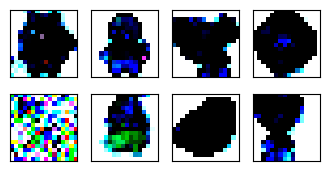

In [29]:
ctx = torch.tensor([
    # hero, non-hero, food, spell, side-facing
    [1,0,0,0,0],
    [1,0,0,0,0],
    [0,0,0,0,1],
    [0,0,0,0,1],
    [0,1,0,0,0],
    [0,1,0,0,0],
    [0,0,1,0,0],
    [0,0,1,0,0],
]).float().to(device)
samples, _ = sample_ddpm(ctx.shape[0], context=ctx)
show_images(samples)

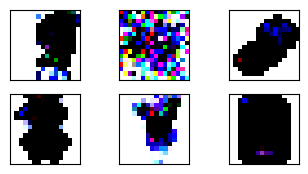

In [30]:
# Mix of defined context
ctx = torch.tensor([
    # hero, non-hero, food, spell, side-facing
    [1,0,0,0,0],  # human
    [1,0,0.6,0,0],
    [0,0,0.6,0.4,0],
    [1,0,0,0,1],
    [1,1,0,0,0],
    [1,0,0,1,0]
]).float().to(device)
samples, _ = sample_ddpm(ctx.shape[0], context=ctx)
show_images(samples)